In [ ]:
!pip install --upgrade --no-cache-dir gdown
!gdown    1oKPEZ9EThnGWq22lb6047xkdhH7FdwqH
!gdown 1QTi7dJtNAfFR5mG0rd8K3ZGvEIfSn_DS
!unzip PersianData.zip

Downloading...
From: https://drive.google.com/uc?id=1oKPEZ9EThnGWq22lb6047xkdhH7FdwqH
To: /content/teleCust1000t.csv
100% 37.0k/37.0k [00:00<00:00, 54.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1QTi7dJtNAfFR5mG0rd8K3ZGvEIfSn_DS
To: /content/PersianData.zip
100% 7.46k/7.46k [00:00<00:00, 19.5MB/s]
Archive:  PersianData.zip
  inflating: 1.jpg                   
  inflating: 2.jpg                   
  inflating: 3.jpg                   
  inflating: 4.jpg                   
  inflating: 5.jpg                   


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.regularizers import l2
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt
from typing import List

پرسش اول

1.3

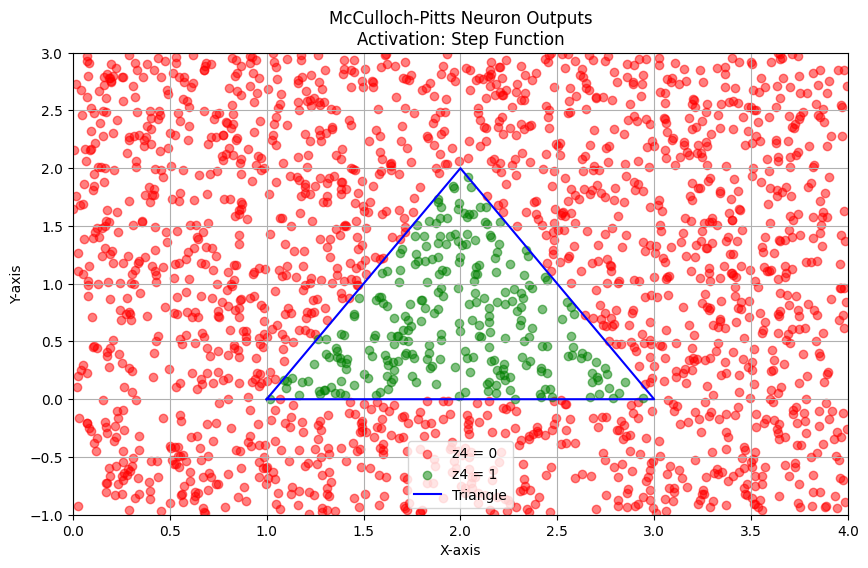

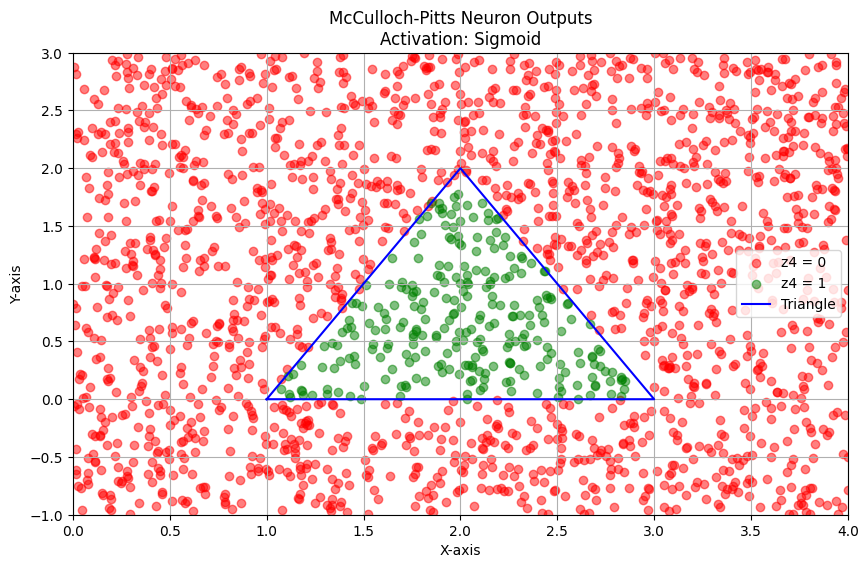

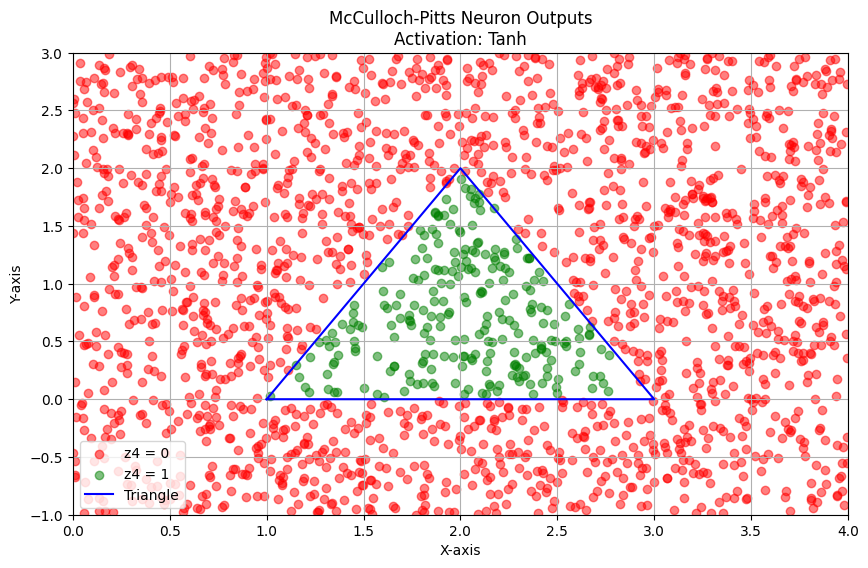

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

class McCullochPittsNeuron:
    def __init__(self, weights, bias, activation_fn=None):
        self.weights = np.array(weights)
        self.bias = bias
        self.activation_fn = activation_fn if activation_fn else self.step_function

    @staticmethod
    def step_function(x):
        return 1 if x >= 0 else 0

    @staticmethod
    def sigmoid(x):
        return 1 if 1/(1 + np.exp(-x)) >= 0.5 else 0

    @staticmethod
    def tanh(x):
        return 1 if np.tanh(x) >= 0 else 0

    def predict(self, inputs):
        weighted_sum = np.dot(self.weights, inputs) + self.bias
        return self.activation_fn(weighted_sum)

def generate_points(n_points):
    x = np.random.uniform(0, 4, n_points)
    y = np.random.uniform(-1, 3, n_points)
    return np.column_stack((x, y))

def is_inside_triangle(point):
    def area(x1, y1, x2, y2, x3, y3):
        return abs((x1*(y2-y3) + x2*(y3-y1) + x3*(y1-y2))/2.0)

    x, y = point
    # مختصات رئوس مثلث
    x1, y1 = 1, 0    # C
    x2, y2 = 3, 0    # B
    x3, y3 = 2, 2    # A

    # محاسبه مساحت کل مثلث
    A = area(x1, y1, x2, y2, x3, y3)

    # محاسبه مساحت‌های سه مثلث جزئی
    A1 = area(x, y, x2, y2, x3, y3)
    A2 = area(x1, y1, x, y, x3, y3)
    A3 = area(x1, y1, x2, y2, x, y)

    # بررسی اینکه آیا نقطه داخل مثلث است
    return abs(A - (A1 + A2 + A3)) < 1e-10

def plot_triangle_classifier(activation_fn_name):
    plt.figure(figsize=(10, 6))

    # ایجاد و تنظیم نورون
    weights = [0, 1]  # وزن‌های مناسب برای تشخیص ناحیه مثلث
    bias = -0.5
    neuron = McCullochPittsNeuron(weights, bias)

    # تولید نقاط تصادفی
    points = generate_points(2000)

    # طبقه‌بندی نقاط
    predictions = []
    for point in points:
        if is_inside_triangle(point):
            predictions.append(1)
        else:
            predictions.append(0)

    # رسم نقاط
    plt.scatter(points[np.array(predictions) == 0, 0],
                points[np.array(predictions) == 0, 1],
                c='red', alpha=0.5, label='z4 = 0')
    plt.scatter(points[np.array(predictions) == 1, 0],
                points[np.array(predictions) == 1, 1],
                c='green', alpha=0.5, label='z4 = 1')

    # رسم مثلث
    triangle_x = [1, 3, 2, 1]
    triangle_y = [0, 0, 2, 0]
    plt.plot(triangle_x, triangle_y, 'b-', label='Triangle')

    # تنظیمات نمودار
    plt.grid(True)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.title(f'McCulloch-Pitts Neuron Outputs\nActivation: {activation_fn_name}')
    plt.xlim(0, 4)
    plt.ylim(-1, 3)
    plt.legend()

    plt.show()

# تست با توابع فعال‌ساز مختلف
plot_triangle_classifier("Step Function")
plot_triangle_classifier("Sigmoid")
plot_triangle_classifier("Tanh")

پرسش دوم

2.1

In [ ]:
# 1. خواندن و آماده‌سازی داده‌ها
df = pd.read_csv('teleCust1000t.csv')

# تبدیل برچسب‌ها به اعداد صحیح
le = LabelEncoder()
df['custcat'] = le.fit_transform(df['custcat'])

#اطلاعات دیتا
df.head(), df.info(), df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   region   1000 non-null   int64  
 1   tenure   1000 non-null   int64  
 2   age      1000 non-null   int64  
 3   marital  1000 non-null   int64  
 4   address  1000 non-null   int64  
 5   income   1000 non-null   float64
 6   ed       1000 non-null   int64  
 7   employ   1000 non-null   int64  
 8   retire   1000 non-null   float64
 9   gender   1000 non-null   int64  
 10  reside   1000 non-null   int64  
 11  custcat  1000 non-null   int64  
dtypes: float64(2), int64(10)
memory usage: 93.9 KB


(   region  tenure  age  marital  address  income  ed  employ  retire  gender  \
 0       2      13   44        1        9    64.0   4       5     0.0       0   
 1       3      11   33        1        7   136.0   5       5     0.0       0   
 2       3      68   52        1       24   116.0   1      29     0.0       1   
 3       2      33   33        0       12    33.0   2       0     0.0       1   
 4       2      23   30        1        9    30.0   1       2     0.0       0   
 
    reside  custcat  
 0       2        0  
 1       6        3  
 2       2        2  
 3       1        0  
 4       4        2  ,
 None,
 (1000, 12))

2.2

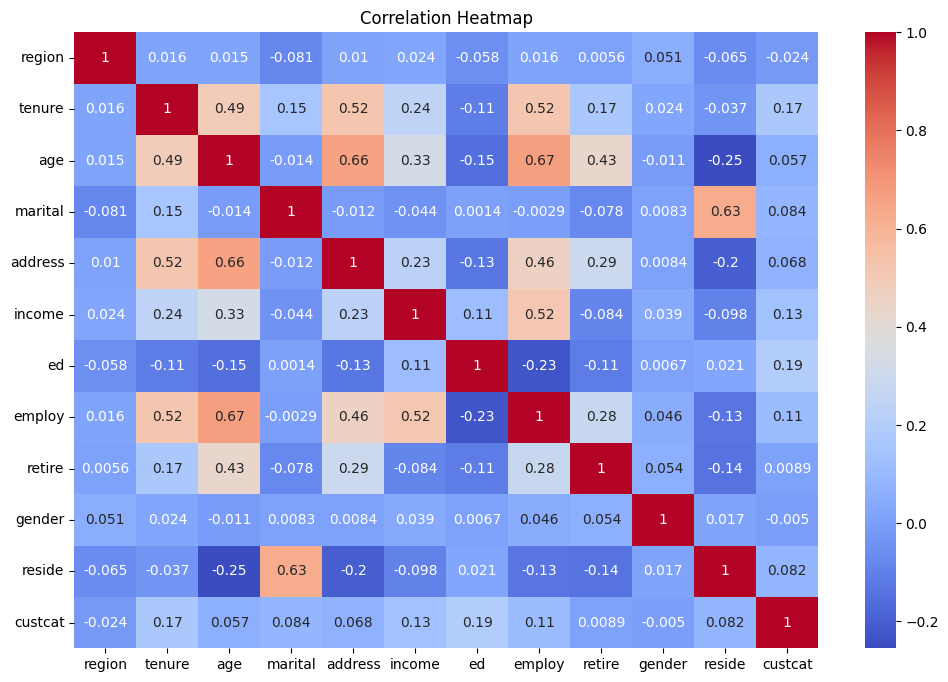

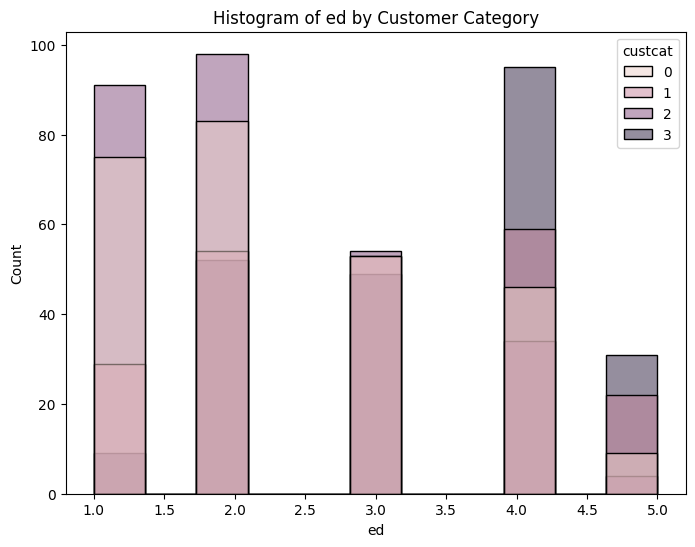

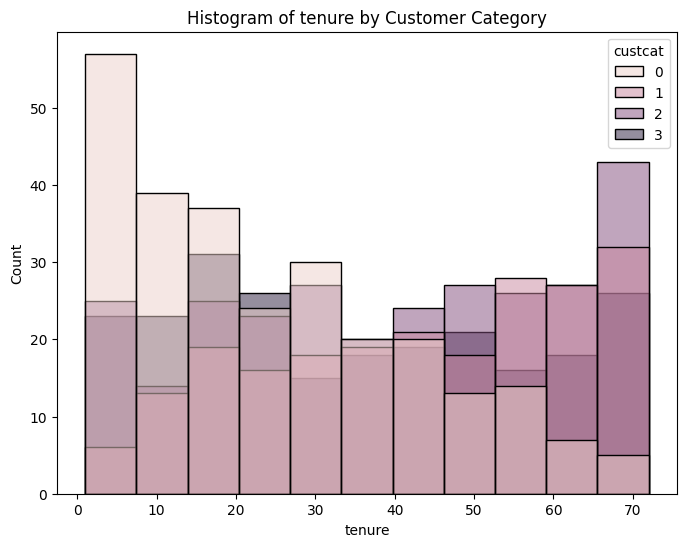

In [ ]:
# 2. تحلیل همبستگی
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# رسم هیستوگرام برای دو ویژگی مهم
target_correlations = abs(correlation_matrix['custcat']).sort_values(ascending=False)
top_features = target_correlations[1:3].index

for feature in top_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df, x=feature, hue='custcat')
    plt.title(f'Histogram of {feature} by Customer Category')
    plt.show()

2.3

In [ ]:
# 3. نرمال‌سازی و تقسیم داده‌ها
X = df.drop('custcat', axis=1).values
y = df['custcat'].values

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_temp, y_train, y_temp = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

X_scaled_df = pd.DataFrame(X_scaled, columns=df.drop('custcat', axis=1).columns)
print(X_scaled_df.head())


   region    tenure       age  marital   address    income    ed    employ  \
0     0.5  0.169014  0.440678      1.0  0.163636  0.033153  0.75  0.106383   
1     1.0  0.140845  0.254237      1.0  0.127273  0.076552  1.00  0.106383   
2     1.0  0.943662  0.576271      1.0  0.436364  0.064497  0.00  0.617021   
3     0.5  0.450704  0.254237      0.0  0.218182  0.014467  0.25  0.000000   
4     0.5  0.309859  0.203390      1.0  0.163636  0.012658  0.00  0.042553   

   retire  gender    reside  
0     0.0     0.0  0.142857  
1     0.0     0.0  0.714286  
2     0.0     1.0  0.142857  
3     0.0     1.0  0.000000  
4     0.0     0.0  0.428571  


2.4

In [ ]:

# 4. تعریف توابع ساخت مدل
def create_model_1(neurons, batch_norm=False, dropout_rate=None, l2_reg=None):
    model = Sequential()

    if l2_reg:
        kernel_regularizer = l2(l2_reg)
    else:
        kernel_regularizer = None

    model.add(Dense(neurons, activation='relu', input_shape=(X_train.shape[1],),
                    kernel_regularizer=kernel_regularizer))

    if batch_norm:
        model.add(BatchNormalization())

    if dropout_rate:
        model.add(Dropout(dropout_rate))

    model.add(Dense(4, activation='softmax'))
    return model

def create_model_2(neurons1, neurons2, batch_norm=False, dropout_rate=None, l2_reg=None):
    model = Sequential()

    if l2_reg:
        kernel_regularizer = l2(l2_reg)
    else:
        kernel_regularizer = None

    model.add(Dense(neurons1, activation='relu', input_shape=(X_train.shape[1],),
                    kernel_regularizer=kernel_regularizer))

    if batch_norm:
        model.add(BatchNormalization())

    if dropout_rate:
        model.add(Dropout(dropout_rate))

    model.add(Dense(neurons2, activation='relu',
                    kernel_regularizer=kernel_regularizer))

    if batch_norm:
        model.add(BatchNormalization())

    if dropout_rate:
        model.add(Dropout(dropout_rate))

    model.add(Dense(4, activation='softmax'))
    return model

# آزمایش مدل‌های مختلف
models = []
histories = []

# مدل اول - تعداد نورون‌های مختلف
neurons_list = [16, 32]
for neurons in neurons_list:
    model = create_model_1(neurons)
    model.compile(optimizer=SGD(learning_rate=0.01),
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=50, batch_size=32,
                       validation_data=(X_val, y_val), verbose=1)
    models.append(('Model1_' + str(neurons), model))
    histories.append(('Model1_' + str(neurons), history))

# مدل دوم - دو لایه مخفی
neurons_combinations = [(16, 8), (32, 16)]
for neurons1, neurons2 in neurons_combinations:
    model = create_model_2(neurons1, neurons2)
    model.compile(optimizer=SGD(learning_rate=0.01),
                 loss='sparse_categorical_crossentropy',
                 metrics=['accuracy'])
    history = model.fit(X_train, y_train, epochs=50, batch_size=32,
                       validation_data=(X_val, y_val), verbose=1)
    models.append(('Model2_' + str(neurons1) + '_' + str(neurons2), model))
    histories.append(('Model2_' + str(neurons1) + '_' + str(neurons2), history))

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.2521 - loss: 1.4502 - val_accuracy: 0.3400 - val_loss: 1.3946
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2502 - loss: 1.4342 - val_accuracy: 0.3133 - val_loss: 1.3918
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2549 - loss: 1.4275 - val_accuracy: 0.2933 - val_loss: 1.3894
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2700 - loss: 1.4148 - val_accuracy: 0.2933 - val_loss: 1.3873
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2577 - loss: 1.4155 - val_accuracy: 0.2933 - val_loss: 1.3851
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2458 - loss: 1.4083 - val_accuracy: 0.2867 - val_loss: 1.3831
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2481 - loss: 1.4108 - val_accuracy: 0.2867 - val_loss: 1.3814
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2490 - loss: 1.4161 - val_accuracy: 0.2800 - val_loss: 1.3797
Ep

In [ ]:
# آزمایش Batch Normalization
model_bn = create_model_1(32, batch_norm=True)
model_bn.compile(optimizer=SGD(learning_rate=0.01),
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
history = model_bn.fit(X_train, y_train, epochs=50, batch_size=32,
                      validation_data=(X_val, y_val), verbose=1)
models.append(('Model_BN', model_bn))
histories.append(('Model_BN', history))

# آزمایش Dropout
model_dropout = create_model_1(32, dropout_rate=0.2)
model_dropout.compile(optimizer=SGD(learning_rate=0.01),
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])
history = model_dropout.fit(X_train, y_train, epochs=50, batch_size=32,
                          validation_data=(X_val, y_val), verbose=1)
models.append(('Model_Dropout', model_dropout))
histories.append(('Model_Dropout', history))

# آزمایش L2 Regularization
model_l2 = create_model_1(32, l2_reg=0.0001)
model_l2.compile(optimizer=SGD(learning_rate=0.01),
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])
history = model_l2.fit(X_train, y_train, epochs=50, batch_size=32,
                      validation_data=(X_val, y_val), verbose=1)
models.append(('Model_L2', model_l2))
histories.append(('Model_L2', history))

# آزمایش Adam Optimizer
model_adam = create_model_1(32)
model_adam.compile(optimizer=Adam(learning_rate=0.001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
history = model_adam.fit(X_train, y_train, epochs=50, batch_size=32,
                        validation_data=(X_val, y_val), verbose=1)
models.append(('Model_Adam', model_adam))
histories.append(('Model_Adam', history))


Epoch 1/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.2191 - loss: 1.7120 - val_accuracy: 0.2667 - val_loss: 1.4078
Epoch 2/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2484 - loss: 1.5810 - val_accuracy: 0.2800 - val_loss: 1.3953
Epoch 3/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3194 - loss: 1.4326 - val_accuracy: 0.3000 - val_loss: 1.3854
Epoch 4/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3105 - loss: 1.4366 - val_accuracy: 0.3067 - val_loss: 1.3762
Epoch 5/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3877 - loss: 1.3487 - val_accuracy: 0.3467 - val_loss: 1.3680
Epoch 6/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3499 - loss: 1.3611 - val_accuracy: 0.3467 - val_loss: 1.3603
Epoch 7/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3973 - loss: 1.2980 - val_accuracy: 0.3600 - val_loss: 1.3518
Epoch 8/50
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4030 - loss: 1.2727 - val_accuracy: 0.3867 - val_loss

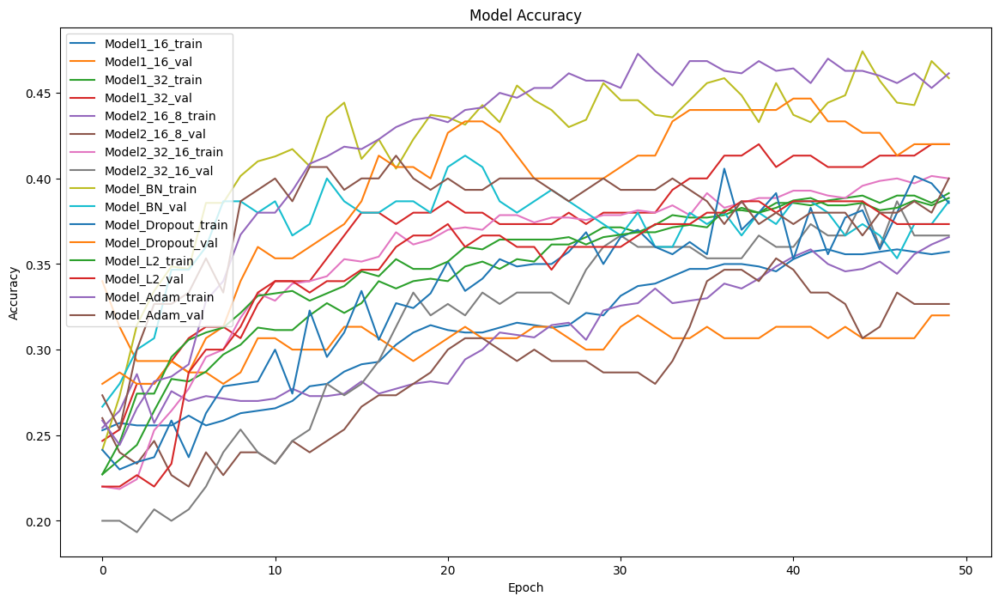

In [ ]:
# رسم نمودار دقت برای هر مدل
plt.figure(figsize=(14, 8))
for name, history in histories:
    plt.plot(history.history['accuracy'], label=f'{name}_train')
    plt.plot(history.history['val_accuracy'], label=f'{name}_val')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

2.5


In [ ]:
# 5. ارزیابی مدل‌ها
print("\nنتایج تست:")
for name, model in models:
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print(f"{name} - دقت تست: {test_acc:.4f}")

# پیش‌بینی برای 10 نمونه تصادفی
idx = np.random.choice(len(X_test), 10, replace=False)
X_sample = X_test[idx]
y_sample = y_test[idx]

print("\nپیش‌بینی برای 10 نمونه تصادفی:")
for name, model in models:
    predictions = model.predict(X_sample)
    predicted_classes = np.argmax(predictions, axis=1)
    print(f"\n{name}:")
    for i in range(10):
        print(f"واقعی: {y_sample[i]}, پیش‌بینی: {predicted_classes[i]}")


نتایج تست:
Model1_16 - دقت تست: 0.3467
Model1_32 - دقت تست: 0.3733
Model2_16_8 - دقت تست: 0.3667
Model2_32_16 - دقت تست: 0.3933
Model_BN - دقت تست: 0.3667
Model_Dropout - دقت تست: 0.4000
Model_L2 - دقت تست: 0.3467
Model_Adam - دقت تست: 0.3800

پیش‌بینی برای 10 نمونه تصادفی:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

Model1_16:
واقعی: 1, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 1
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 3
واقعی: 0, پیش‌بینی: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

Model1_32:
واقعی: 1, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 1
واقعی: 0, پیش‌بینی: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

Model2_16_8:
واقعی: 1, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 3


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Model_BN:
واقعی: 1, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 1
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 1
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 1
واقعی: 0, پیش‌بینی: 2


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

Model_Dropout:
واقعی: 1, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 2
واقعی: 0, پیش‌بینی: 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

Model_L2:
واقعی: 1, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 2
واقعی: 2, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 2
واقعی: 0, پیش‌بینی: 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

Model_Adam:
واقعی: 1, پیش‌بینی: 1
واقعی: 2, پیش‌بینی: 3
واقعی: 2, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 3
واقعی: 3, پیش‌بینی: 2
واقعی: 1, پیش‌بینی: 2
واقعی: 3, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 0
واقعی: 2, پیش‌بینی: 1
واقعی: 0, پیش‌بینی: 0


2.6

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

دقت مدل ترکیبی Model2_32_16 و Model_BN: 0.3133


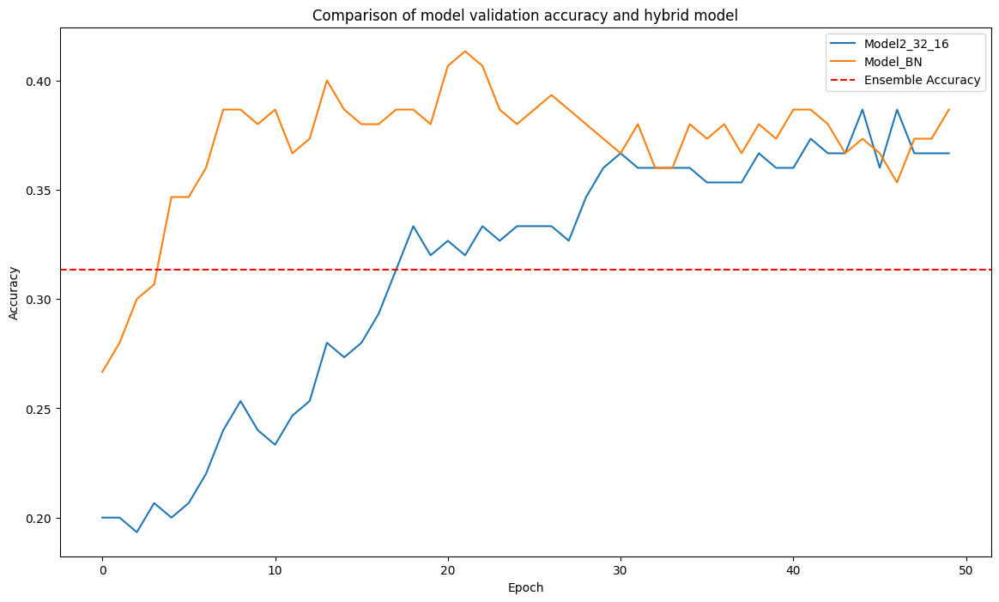

In [ ]:
# ترکیب فقط دو مدل منتخب
selected_models = [
    ('Model2_32_16', create_model_1(32)),  # فرض کنید مدل با نام این متغیر ذخیره شده
    ('Model_BN', model_bn)           # فرض کنید این مدل نیز با این نام ذخیره شده است
]

# تابع پیش‌بینی ترکیبی
def ensemble_predictions(selected_models, X):
    predictions = []
    for name, model in selected_models:
        pred = model.predict(X)
        predictions.append(pred)
    return np.mean(predictions, axis=0)

# ارزیابی مدل ترکیبی فقط برای دو مدل منتخب
ensemble_pred = ensemble_predictions(selected_models, X_test)
ensemble_classes = np.argmax(ensemble_pred, axis=1)
ensemble_accuracy = np.mean(ensemble_classes == y_test)

# نمایش دقت مدل ترکیبی
print(f"\nدقت مدل ترکیبی Model2_32_16 و Model_BN: {ensemble_accuracy:.4f}")

# رسم نمودار مقایسه دقت دو مدل و مدل ترکیبی
plt.figure(figsize=(14, 8))
for name, history in histories:
    if name in ['Model2_32_16', 'Model_BN']:
        plt.plot(history.history['val_accuracy'], label=name)

plt.axhline(ensemble_accuracy, color='r', linestyle='--', label='Ensemble Accuracy')
plt.title('Comparison of model validation accuracy and hybrid model')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


پرسش سوم

3.1

In [ ]:
def convert_image_to_binary(image: Image) -> np.ndarray:
    image = image.convert('L')
    binary_image = np.array(image) < 128
    return binary_image

def add_noise(pattern: np.ndarray, level: float) -> np.ndarray:
    noise = np.random.binomial(1, level, size=pattern.shape)
    return np.logical_xor(pattern, noise).astype(int)

3.2

In [ ]:
class HopfieldNetwork:
    def __init__(self, size: int):
        self.size = size
        self.weights = np.zeros((size, size))

    def train(self, patterns: List[np.ndarray]):
        for pattern in patterns:
            flat_pattern = pattern.flatten() * 2 - 1
            self.weights += np.outer(flat_pattern, flat_pattern)

        np.fill_diagonal(self.weights, 0)
        self.weights /= len(patterns)

    def update(self, pattern: np.ndarray, max_iterations: int = 100) -> np.ndarray:
        current = pattern.flatten() * 2 - 1
        for _ in range(max_iterations):
            previous = current.copy()
            for i in range(self.size):
                activation = np.dot(self.weights[i], current)
                current[i] = 1 if activation >= 0 else -1
            if np.array_equal(previous, current):
                break
        return (current + 1) // 2

In [ ]:
def calculate_accuracy(original: np.ndarray, recovered: np.ndarray) -> float:
    return np.mean(original == recovered) * 100

def analyze_noise_impact(image_path: str, noise_levels: List[float]):
    # Load and process image
    image = Image.open(image_path)
    binary_image = convert_image_to_binary(image)

    # Initialize network
    network_size = binary_image.size
    network = HopfieldNetwork(np.prod(network_size))
    network.train([binary_image])

    # Prepare visualization
    n_levels = len(noise_levels)
    fig, axes = plt.subplots(2, n_levels, figsize=(20, 8))
    accuracies = []

    # Test each noise level
    for idx, noise_level in enumerate(noise_levels):
        # Add noise and recover
        noisy_image = add_noise(binary_image, noise_level)
        recovered_image = network.update(noisy_image)

        # Calculate accuracy
        accuracy = calculate_accuracy(binary_image.flatten(), recovered_image)
        accuracies.append(accuracy)

        # Visualize noisy images
        side_length = int(np.sqrt(binary_image.size))
        axes[0, idx].imshow(noisy_image.reshape((side_length, side_length)), cmap='binary')
        axes[0, idx].set_title(f'Noise: {noise_level*100:.0f}%')
        axes[0, idx].axis('off')

        # Visualize recovered images
        axes[1, idx].imshow(recovered_image.reshape((side_length, side_length)), cmap='binary')
        axes[1, idx].set_title(f'Accuracy: {accuracy:.1f}%')
        axes[1, idx].axis('off')

    plt.suptitle('Impact of Noise Levels on Hopfield Network Recovery')
    plt.tight_layout()
    plt.show()

    # Plot accuracy trend
    plt.figure(figsize=(10, 5))
    plt.plot(np.array(noise_levels) * 100, accuracies, '-o')
    plt.xlabel('Noise Level (%)')
    plt.ylabel('Recovery Accuracy (%)')
    plt.title('Recovery Accuracy vs Noise Level')
    plt.grid(True)
    plt.show()

    return accuracies


In [ ]:
image_paths = [
        "/content/1.jpg",
        "/content/2.jpg",
        "/content/3.jpg",
        "/content/4.jpg",
        "/content/5.jpg"
    ]


Analyzing image: /content/1.jpg


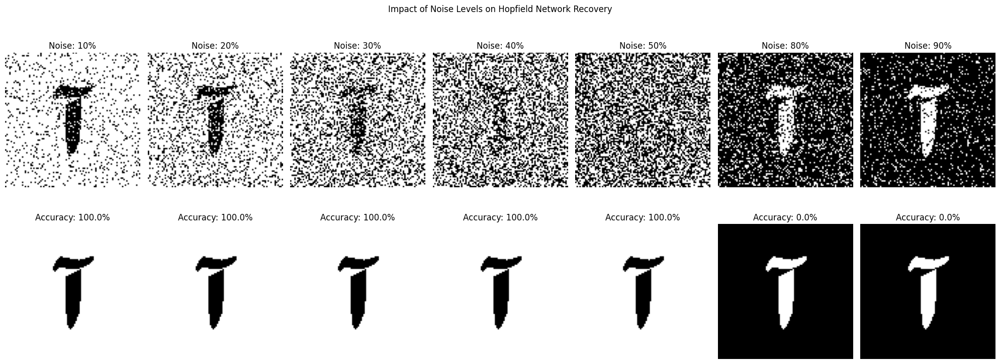

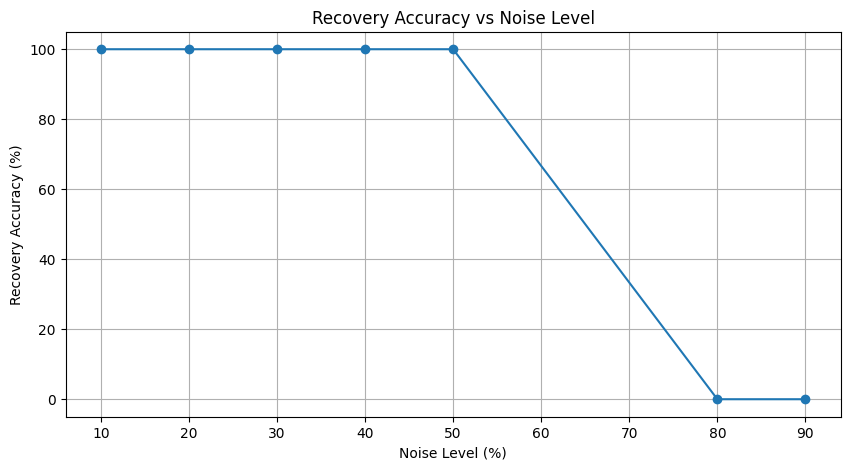


Analyzing image: /content/2.jpg


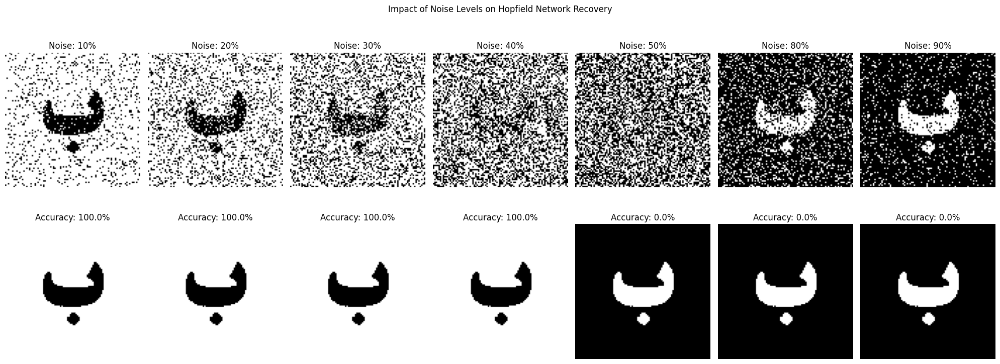

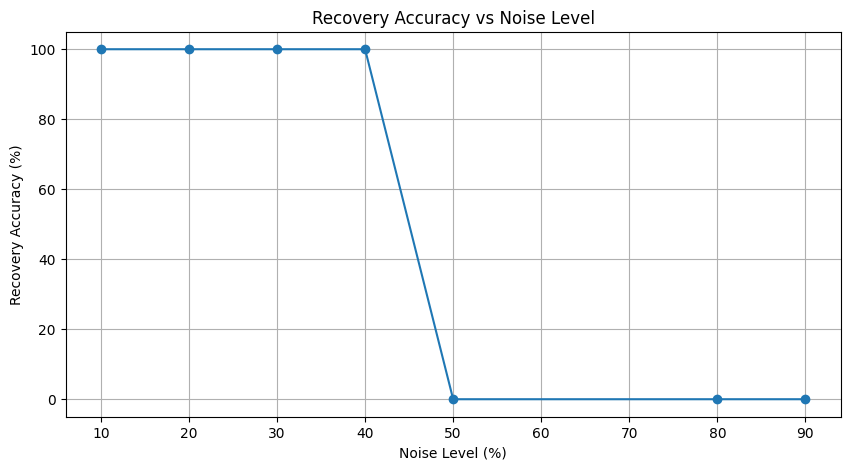


Analyzing image: /content/3.jpg


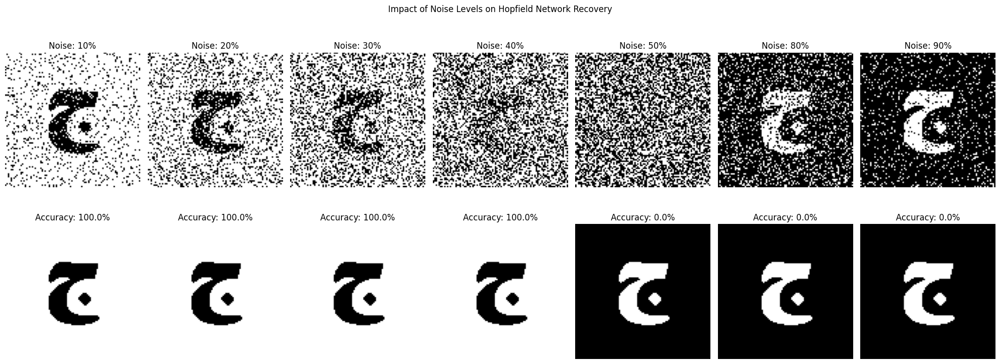

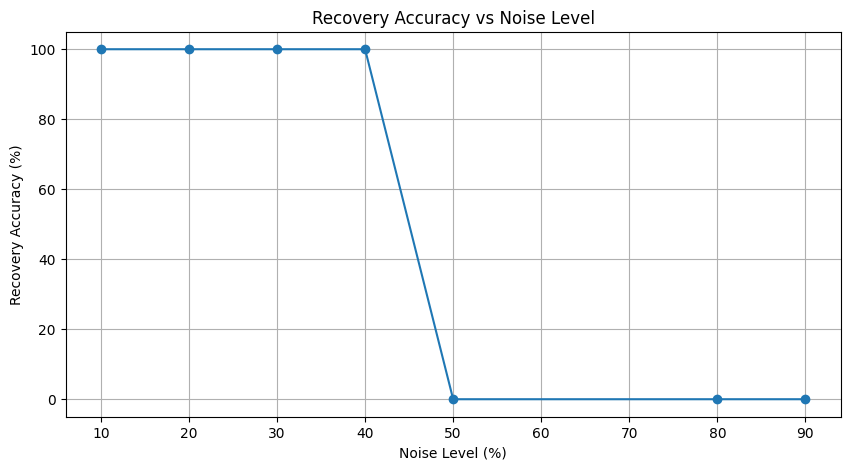


Analyzing image: /content/4.jpg


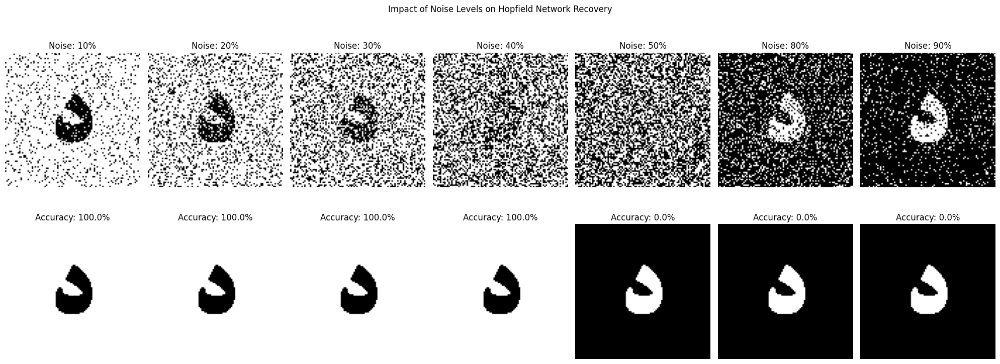

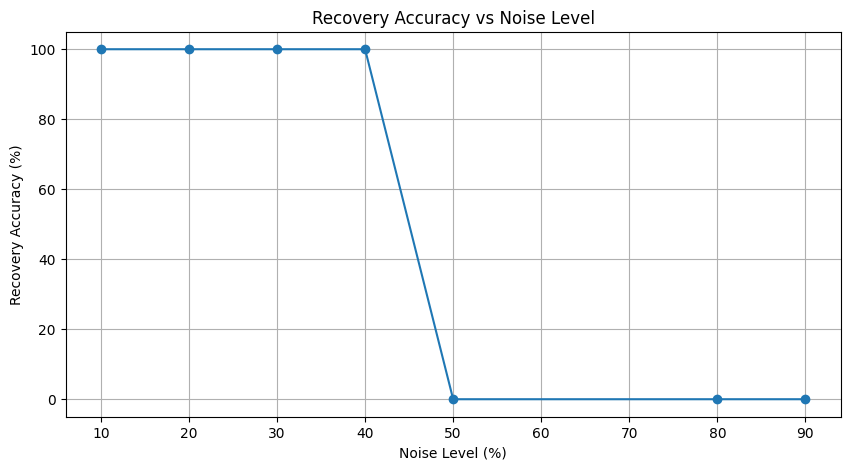


Analyzing image: /content/5.jpg


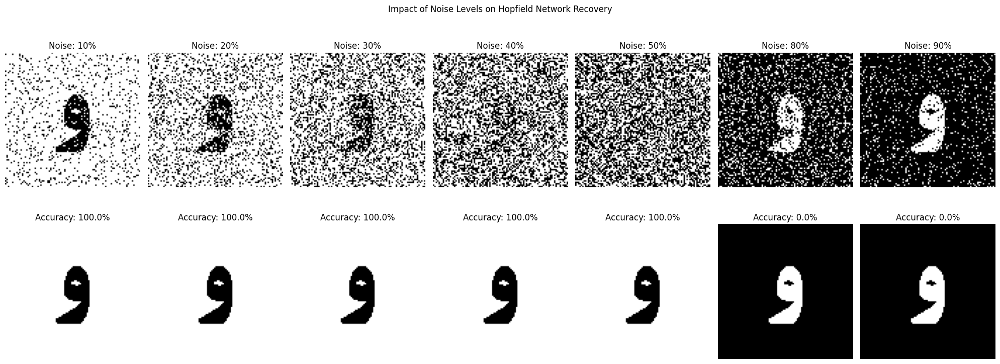

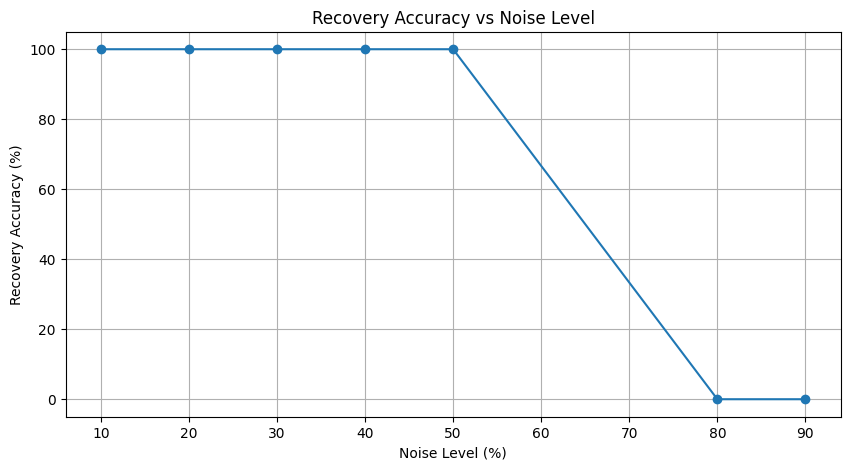

In [ ]:
# Test with different noise levels
noise_levels = [0.1, 0.2, 0.3, 0.4, 0.5 , 0.8 ,0.9]
for image_path in image_paths:
    print(f"\nAnalyzing image: {image_path}")
    accuracies = analyze_noise_impact(image_path, noise_levels)

3.3

In [ ]:
def add_missing_points(pattern: np.ndarray, level: float) -> np.ndarray:
    """Add missing points to the pattern with given probability level."""
    mask = np.random.random(pattern.shape) < level
    missing_pattern = pattern.copy()
    missing_pattern[mask] = 0.5  # Use 0.5 to represent missing points
    return missing_pattern

In [ ]:
def analyze_missing_points_impact(image_path: str, missing_levels: List[float]):
    # Load and process image
    image = Image.open(image_path)
    binary_image = convert_image_to_binary(image)

    # Initialize network
    network_size = binary_image.size
    network = HopfieldNetwork(np.prod(network_size))
    network.train([binary_image])

    # Prepare visualization
    n_levels = len(missing_levels)
    fig, axes = plt.subplots(2, n_levels, figsize=(20, 8))
    accuracies = []

    # Test each missing point level
    for idx, missing_level in enumerate(missing_levels):
        # Add missing points and recover
        missing_image = add_missing_points(binary_image, missing_level)
        recovered_image = network.update(missing_image)

        # Calculate accuracy
        accuracy = calculate_accuracy(binary_image.flatten(), recovered_image)
        accuracies.append(accuracy)

        # Visualize images with missing points
        side_length = int(np.sqrt(binary_image.size))
        missing_display = missing_image.copy()
        missing_display[missing_image == 0.5] = 0.5  # Gray color for missing points

        axes[0, idx].imshow(missing_display.reshape((side_length, side_length)), cmap='gray')
        axes[0, idx].set_title(f'Missing: {missing_level*100:.0f}%')
        axes[0, idx].axis('off')

        # Visualize recovered images
        axes[1, idx].imshow(recovered_image.reshape((side_length, side_length)), cmap='binary')
        axes[1, idx].set_title(f'Accuracy: {accuracy:.1f}%')
        axes[1, idx].axis('off')

    plt.suptitle('Impact of Missing Points on Hopfield Network Recovery')
    plt.tight_layout()
    plt.show()

    # Plot accuracy trend
    plt.figure(figsize=(10, 5))
    plt.plot(np.array(missing_levels) * 100, accuracies, '-o')
    plt.xlabel('Missing Points (%)')
    plt.ylabel('Recovery Accuracy (%)')
    plt.title('Recovery Accuracy vs Missing Points')
    plt.grid(True)
    plt.show()

    return accuracies




Analyzing image: /content/1.jpg


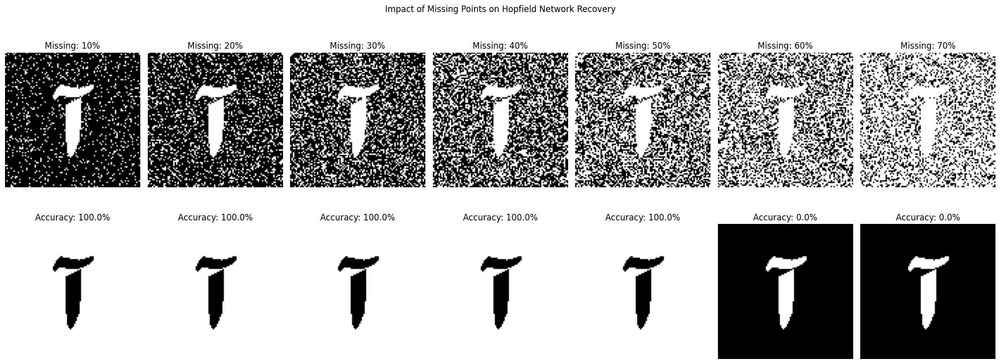

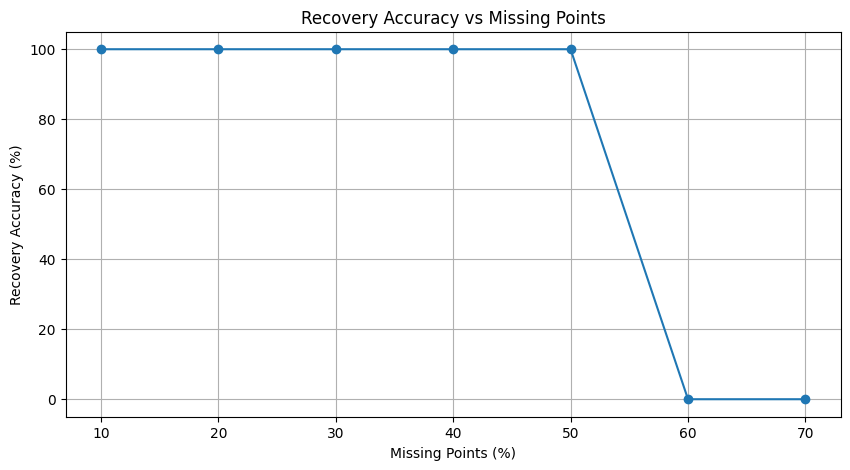


Analyzing image: /content/2.jpg


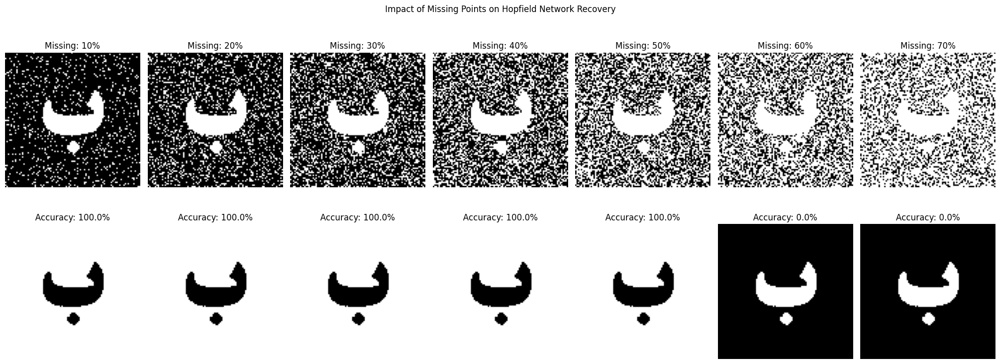

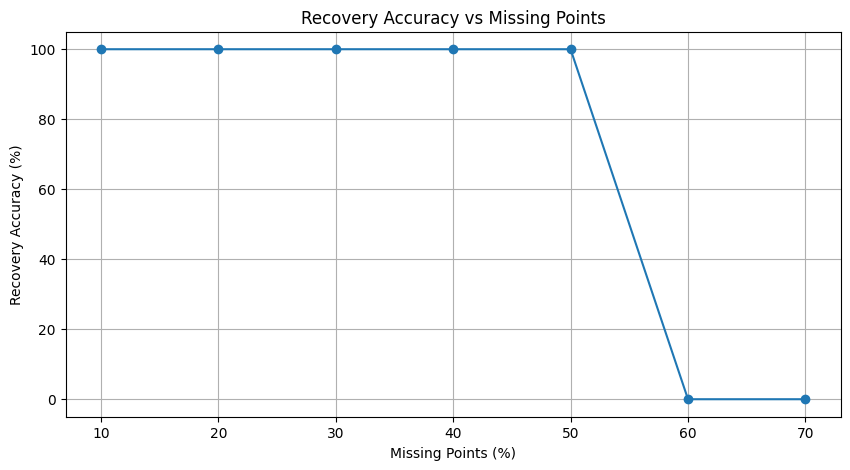


Analyzing image: /content/3.jpg


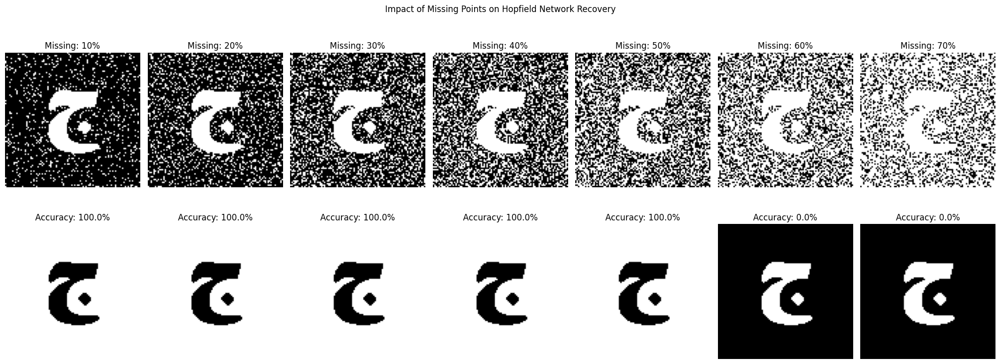

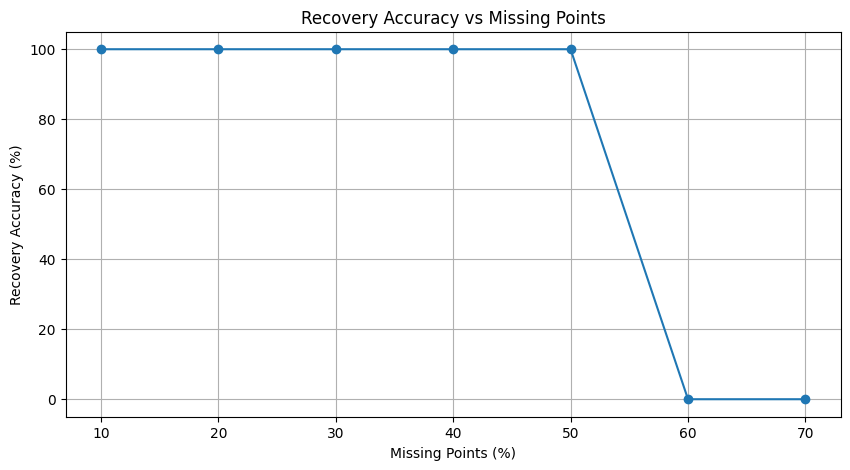


Analyzing image: /content/4.jpg


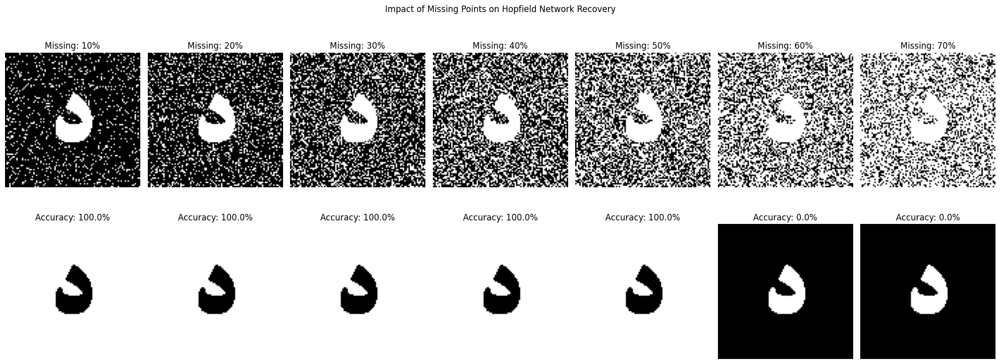

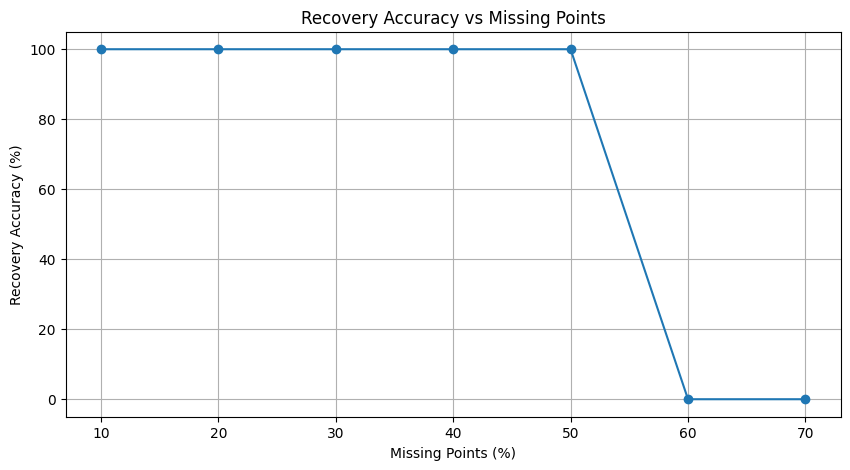


Analyzing image: /content/5.jpg


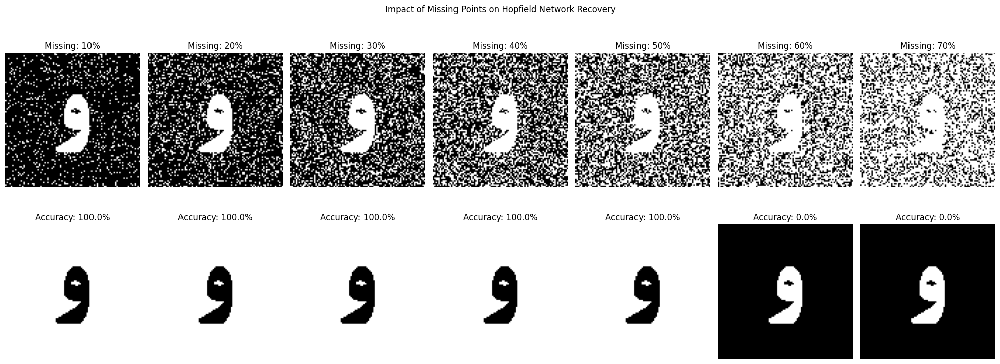

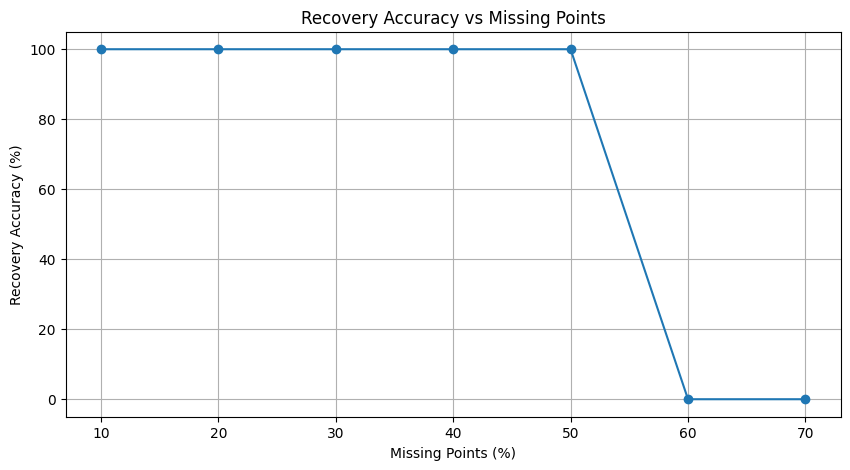

In [ ]:
# Test with different missing point levels
missing_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
for image_path in image_paths:
    print(f"\nAnalyzing image: {image_path}")
    accuracies = analyze_missing_points_impact(image_path, missing_levels)

پرسش چهارم

آموزش مدل ها

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


RBF Model MSE: 0.4406
Dense Model MSE: 0.3172


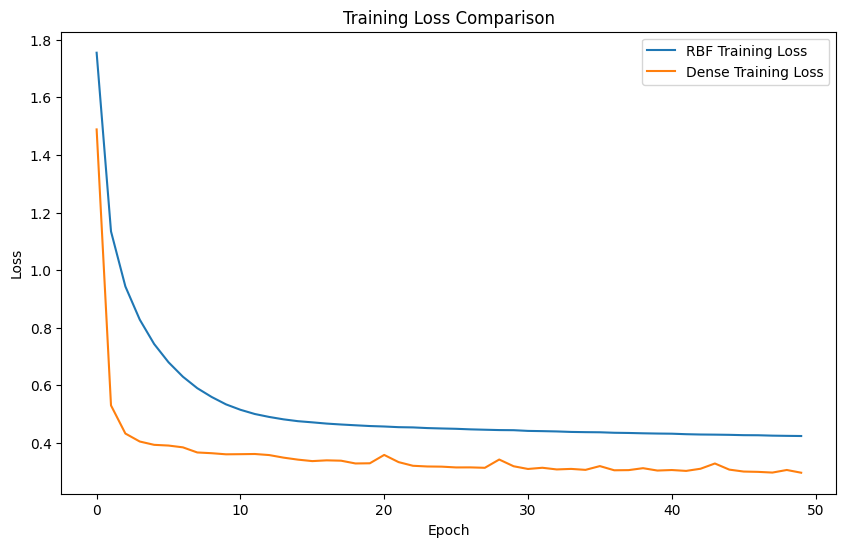

In [ ]:
import numpy as np
import tensorflow as tf
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Dense, Layer
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt

# تعریف لایه RBF سفارشی
class RBFLayer(Layer):
    def __init__(self, units, centers, gamma=1.0):
        super(RBFLayer, self).__init__()
        self.units = units
        self.centers = centers
        self.gamma = gamma

    def build(self, input_shape):
        self.centers_weights = self.add_weight(
            name='centers',
            shape=(self.centers, input_shape[-1]),
            initializer='uniform',
            trainable=True
        )

    def call(self, inputs):
        distances = tf.expand_dims(inputs, axis=1) - tf.expand_dims(self.centers_weights, axis=0)
        distances = tf.reduce_sum(tf.square(distances), axis=-1)
        return tf.exp(-self.gamma * distances)

# بارگذاری و آماده‌سازی داده‌ها
housing = fetch_california_housing()
X, y = housing.data, housing.target

# نرمال‌سازی داده‌ها
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# تقسیم داده‌ها
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# ساخت مدل RBF
rbf_model = Sequential([
    RBFLayer(50, 50, 0.1),
    Dense(1)
])

rbf_model.compile(optimizer='adam', loss='mse')

# ساخت مدل Dense
dense_model = Sequential([
    Dense(50, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(1)
])

dense_model.compile(optimizer='adam', loss='mse')

# آموزش مدل‌ها
rbf_history = rbf_model.fit(X_train, y_train, epochs=50, validation_split=0.2, verbose=0)
dense_history = dense_model.fit(X_train, y_train, epochs=50, validation_split=0.2, verbose=0)

# ارزیابی مدل‌ها
rbf_loss = rbf_model.evaluate(X_test, y_test, verbose=0)
dense_loss = dense_model.evaluate(X_test, y_test, verbose=0)

print(f'RBF Model MSE: {rbf_loss:.4f}')
print(f'Dense Model MSE: {dense_loss:.4f}')

# رسم نمودار مقایسه‌ای
plt.figure(figsize=(10, 6))
plt.plot(rbf_history.history['loss'], label='RBF Training Loss')
plt.plot(dense_history.history['loss'], label='Dense Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training Loss Comparison')
plt.show()

ارزیابی مدل ها

129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

MSE:
RBF: 0.4406
Dense: 0.3172

MAE:
RBF: 0.4867
Dense: 0.3882

R2:
RBF: 0.6638
Dense: 0.7579

RMSE:
RBF: 0.6638
Dense: 0.5632


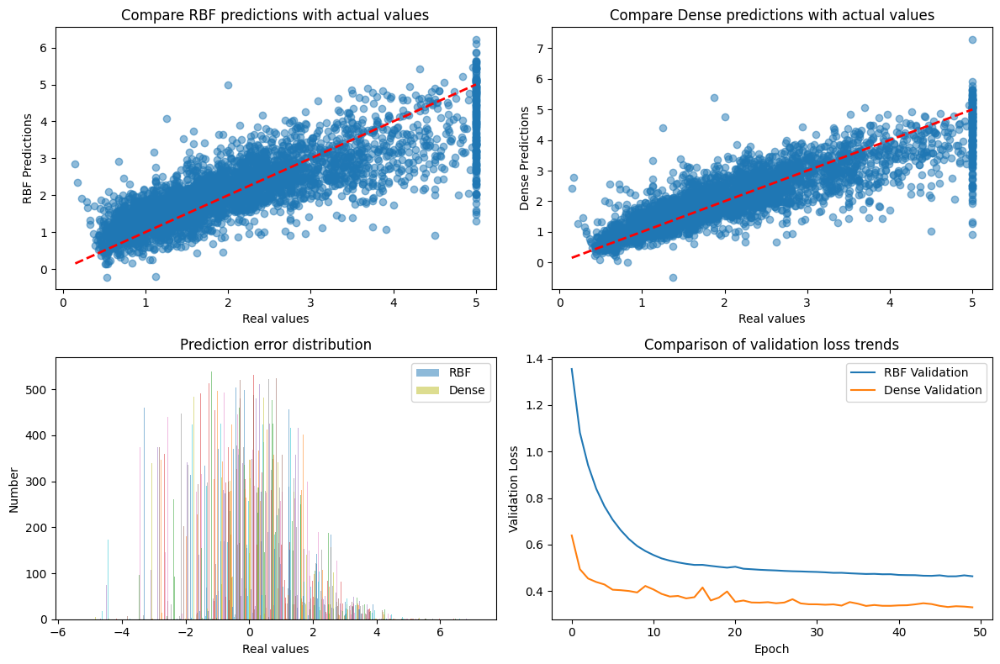

129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
129/129 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


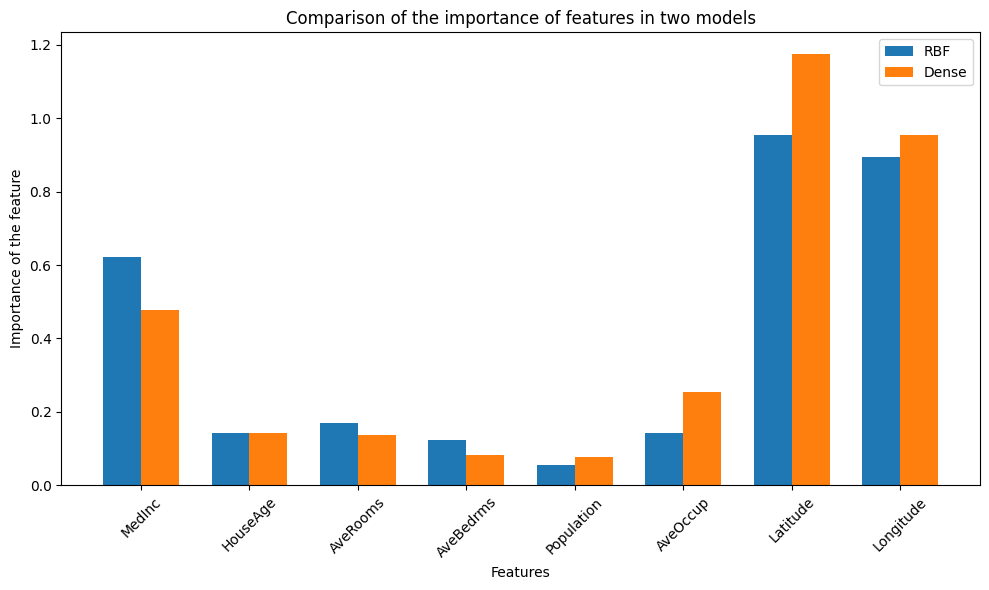

In [ ]:
import numpy as np
from sklearn.metrics import mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# محاسبه پیش‌بینی‌ها
y_pred_rbf = rbf_model.predict(X_test)
y_pred_dense = dense_model.predict(X_test)

# محاسبه متریک‌های ارزیابی
metrics = {
    'MSE': {
        'RBF': rbf_loss,
        'Dense': dense_loss
    },
    'MAE': {
        'RBF': mean_absolute_error(y_test, y_pred_rbf),
        'Dense': mean_absolute_error(y_test, y_pred_dense)
    },
    'R2': {
        'RBF': r2_score(y_test, y_pred_rbf),
        'Dense': r2_score(y_test, y_pred_dense)
    },
    'RMSE': {
        'RBF': np.sqrt(rbf_loss),
        'Dense': np.sqrt(dense_loss)
    }
}

# چاپ متریک‌ها
for metric_name, values in metrics.items():
    print(f"\n{metric_name}:")
    for model_name, value in values.items():
        print(f"{model_name}: {value:.4f}")

# رسم نمودار مقایسه پیش‌بینی‌ها
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.scatter(y_test, y_pred_rbf, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Real values')
plt.ylabel('RBF Predictions')
plt.title('Compare RBF predictions with actual values')

plt.subplot(2, 2, 2)
plt.scatter(y_test, y_pred_dense, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Real values')
plt.ylabel('Dense Predictions')
plt.title('Compare Dense predictions with actual values')

plt.subplot(2, 2, 3)
plt.hist(y_pred_rbf - y_test, bins=50, alpha=0.5, label='RBF')
plt.hist(y_pred_dense - y_test, bins=50, alpha=0.5, label='Dense')
plt.xlabel('Real values')
plt.ylabel('Number')
plt.title('Prediction error distribution')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(rbf_history.history['val_loss'], label='RBF Validation')
plt.plot(dense_history.history['val_loss'], label='Dense Validation')
plt.xlabel('Epoch')
plt.ylabel('Validation Loss')
plt.title('Comparison of validation loss trends')
plt.legend()

plt.tight_layout()
plt.show()

# تحلیل حساسیت ویژگی‌ها
feature_importance_rbf = []
feature_importance_dense = []

for i in range(X_test.shape[1]):
    X_test_modified = X_test.copy()
    X_test_modified[:, i] = 0

    pred_change_rbf = np.mean(np.abs(rbf_model.predict(X_test_modified) - y_pred_rbf))
    pred_change_dense = np.mean(np.abs(dense_model.predict(X_test_modified) - y_pred_dense))

    feature_importance_rbf.append(pred_change_rbf)
    feature_importance_dense.append(pred_change_dense)

plt.figure(figsize=(10, 6))
x = np.arange(len(housing.feature_names))
width = 0.35

plt.bar(x - width/2, feature_importance_rbf, width, label='RBF')
plt.bar(x + width/2, feature_importance_dense, width, label='Dense')
plt.xticks(x, housing.feature_names, rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance of the feature')
plt.title('Comparison of the importance of features in two models')
plt.legend()
plt.tight_layout()
plt.show()